In [190]:
import pandas as pd
import numpy as np

In [191]:
df = pd.read_csv('monthly_avg_prices.csv', keep_default_na=True, delimiter=',', skipinitialspace=True)
df

,RegionID,SizeRank,RegionName,RegionType,StateName,State,City,Metro,CountyName,2000-01-31,...,2023-08-31,2023-09-30,2023-10-31,2023-11-30,2023-12-31,2024-01-31,2024-02-29,2024-03-31,2024-04-30,2024-05-31
0,91982,1,77494,zip,TX,TX,Katy,"Houston-The Woodlands-Sugar Land, TX",Fort Bend County,213709.233931,...,491315.526103,493166.058739,494426.875064,495129.074438,495753.655023,497152.495599,499350.693362,502209.431348,504772.592373,506108.328812
1,61148,2,8701,zip,NJ,NJ,Lakewood,"New York-Newark-Jersey City, NY-NJ-PA",Ocean County,137223.944250,...,557714.505434,564034.189812,571369.251731,578165.889623,582930.938013,584513.712504,587069.676988,592163.786073,600460.331624,607796.724917
2,91940,3,77449,zip,TX,TX,Katy,"Houston-The Woodlands-Sugar Land, TX",Harris County,104647.143324,...,281166.106220,281706.625300,281696.287207,281458.482203,281163.821113,281522.469113,282230.217624,283337.911465,284307.117508,284846.166262
3,62080,4,11368,zip,NY,NY,New York,"New York-Newark-Jersey City, NY-NJ-PA",Queens County,147948.413848,...,460295.980935,459739.008834,457713.854415,454362.198597,450079.153295,447252.566558,445649.759398,448707.730544,453215.094826,457834.614429
4,91733,5,77084,zip,TX,TX,Houston,"Houston-The Woodlands-Sugar Land, TX",Harris County,103546.082723,...,275813.536219,276248.093587,276238.298956,275811.529023,275383.171985,275429.757000,275961.374412,276973.605104,277976.199728,278483.936046
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26341,100030,39992,98934,zip,WA,WA,Kittitas,"Ellensburg, WA",Kittitas County,NaN,...,320897.149985,321421.433105,320611.945990,319714.474268,318878.524827,318260.571649,317332.933815,317640.098363,319325.795838,321201.264011
26342,92085,39992,77661,zip,TX,TX,NaN,"Houston-The Woodlands-Sugar Land, TX",Chambers County,NaN,...,198097.455520,197805.880748,196195.733980,193324.356466,190204.800251,188693.297058,187437.379618,187097.514801,186797.420439,186241.935051
26343,64277,39992,15731,zip,PA,PA,Coral,"Indiana, PA",Indiana County,NaN,...,71459.117674,73035.138620,75061.008800,76801.522498,77875.102753,78328.685001,78541.948137,78903.305686,79439.309001,80145.963276
26344,98183,39992,95419,zip,CA,CA,Camp Meeker,"Santa Rosa-Petaluma, CA",Sonoma County,88602.250715,...,463251.984671,458561.436182,455750.854547,453029.281444,451901.717081,448985.523834,448322.698797,449280.890578,452547.151776,452040.619765


In [192]:
# Filter 
df_ny = df[df['StateName'] == 'NY'].copy()
df_ny

,RegionID,SizeRank,RegionName,RegionType,StateName,State,City,Metro,CountyName,2000-01-31,...,2023-08-31,2023-09-30,2023-10-31,2023-11-30,2023-12-31,2024-01-31,2024-02-29,2024-03-31,2024-04-30,2024-05-31
3,62080,4,11368,zip,NY,NY,New York,"New York-Newark-Jersey City, NY-NJ-PA",Queens County,147948.413848,...,460295.980935,459739.008834,457713.854415,454362.198597,450079.153295,447252.566558,445649.759398,448707.730544,453215.094826,457834.614429
6,62093,7,11385,zip,NY,NY,New York,"New York-Newark-Jersey City, NY-NJ-PA",Queens County,260025.016500,...,792245.946701,790274.222136,789009.516569,787787.018297,787650.013605,786305.427654,786364.639913,789372.263924,794137.400227,797132.864525
8,62019,9,11208,zip,NY,NY,New York,"New York-Newark-Jersey City, NY-NJ-PA",Kings County,179741.485783,...,652637.874178,651937.819925,650807.969671,650281.507987,651886.202439,654315.301070,657543.920241,661994.480483,666260.829997,669321.307626
15,62046,16,11236,zip,NY,NY,New York,"New York-Newark-Jersey City, NY-NJ-PA",Kings County,192186.574856,...,627149.304657,628519.322056,629341.766698,629671.260921,631335.324480,633377.284740,636207.236897,639293.399620,642048.446629,643293.483304
16,61807,17,10467,zip,NY,NY,New York,"New York-Newark-Jersey City, NY-NJ-PA",Bronx County,134393.861487,...,354373.349988,355271.331503,352488.843458,347554.532379,340937.885522,336545.249023,333051.508054,332609.479710,330210.153467,328464.422738
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26286,63115,39992,13435,zip,NY,NY,Prospect,"Utica-Rome, NY",Oneida County,NaN,...,153254.183989,156625.549746,159687.145799,161907.999065,162176.646481,161875.566767,162040.843987,163659.687917,165620.497188,167223.734163
26302,62674,39992,12574,zip,NY,NY,Rhinecliff,"Poughkeepsie-Newburgh-Middletown, NY",Dutchess County,NaN,...,571778.202961,566424.729841,562790.717399,561822.523076,560677.404107,559518.573619,560357.921445,563989.635517,569085.251830,575506.288461
26328,63100,39992,13410,zip,NY,NY,Nelliston,"Amsterdam, NY",Montgomery County,29298.936897,...,116699.303233,118470.278229,120304.260099,122465.877045,124463.935113,125646.714955,125760.526874,125816.270011,126275.795159,127601.305729
26332,63622,39992,14592,zip,NY,NY,York,"Rochester, NY",Livingston County,95552.801539,...,197989.165038,199229.473903,200150.115122,200948.739553,201283.867670,200948.935438,200152.790925,200069.346743,201397.656363,203465.791572


In [193]:
nyc_zipcodes = [
    '10001', '10002', '10003', '10004', '10005', '10006', '10007', '10009', '10010', '10011', '10012',
    '10013', '10014', '10016', '10017', '10018', '10019', '10020', '10021', '10022', '10023', '10024',
    '10025', '10026', '10027', '10028', '10029', '10030', '10031', '10032', '10033', '10034', '10035',
    '10036', '10037', '10038', '10039', '10040', '10044', '10045', '10055', '10060', '10065', '10069',
    '10075', '10080', '10103', '10110', '10111', '10112', '10115', '10119', '10128', '10151', '10152',
    '10153', '10154', '10162', '10165', '10167', '10168', '10169', '10170', '10171', '10172', '10173',
    '10174', '10177', '10199', '10271', '10278', '10279', '10280', '10281', '10282', '10301', '10302',
    '10303', '10304', '10305', '10306', '10307', '10308', '10309', '10310', '10311', '10312', '10314',
    '10451', '10452', '10453', '10454', '10455', '10456', '10457', '10458', '10459', '10460', '10461',
    '10462', '10463', '10464', '10465', '10466', '10467', '10468', '10469', '10470', '10471', '10472',
    '10473', '10474', '10475', '11004', '11005', '11101', '11102', '11103', '11104', '11105', '11106',
    '11109', '11201', '11203', '11204', '11205', '11206', '11207', '11208', '11209', '11210', '11211',
    '11212', '11213', '11214', '11215', '11216', '11217', '11218', '11219', '11220', '11221', '11222',
    '11223', '11224', '11225', '11226', '11228', '11229', '11230', '11231', '11232', '11233', '11234',
    '11235', '11236', '11237', '11238', '11239', '11249', '11251', '11354', '11355', '11356', '11357',
    '11358', '11359', '11360', '11361', '11362', '11363', '11364', '11365', '11366', '11367', '11368',
    '11369', '11370', '11372', '11373', '11374', '11375', '11377', '11378', '11379', '11385', '11411',
    '11412', '11413', '11414', '11415', '11416', '11417', '11418', '11419', '11420', '11421', '11422',
    '11423', '11426', '11427', '11428', '11429', '11430', '11432', '11433', '11434', '11435', '11436',
    '11691', '11692', '11693', '11694', '11697'
]

In [194]:
# convert 
df_ny['RegionName'] = df_ny['RegionName'].astype(str)

# Filter NYC
df_nyc = df_ny[df_ny['RegionName'].isin(map(str, nyc_zipcodes))]

In [195]:
df_nyc = df_nyc.drop(columns=['RegionID', 'SizeRank', 'RegionType', 'StateName', 'State', 'City', 'Metro'])

In [196]:
df_melted = pd.melt(df_nyc, 
                    id_vars=['RegionName', 'CountyName'],
                    var_name='Date', 
                    value_name='Price')

In [197]:
# Convert 
df_melted['Date'] = pd.to_datetime(df_melted['Date'], format='%Y-%m-%d')

# Filter 
df_filtered = df_melted[df_melted['Date'].dt.year >= 2010]

In [198]:
df_filtered = df_filtered.sort_values(['RegionName', 'Date'])

In [199]:
df_cleaned = df_filtered.groupby('RegionName').apply(lambda x: x.interpolate())

C:\Users\simon\AppData\Local\Temp\ipykernel_16264\1472979651.py:1: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  df_cleaned = df_filtered.groupby('RegionName').apply(lambda x: x.interpolate())
C:\Users\simon\AppData\Local\Temp\ipykernel_16264\1472979651.py:1: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  df_cleaned = df_filtered.groupby('RegionName').apply(lambda x: x.interpolate())
C:\Users\simon\AppData\Local\Temp\ipykernel_16264\1472979651.py:1: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  df_cleaned = df_filtered.groupby('RegionName').apply(lambda x: x.interpolate())
C:\Users\simon\AppData\Local\Temp\ipykernel

In [200]:
df_cleaned = df_filtered.groupby('RegionName').apply(lambda x: x.fillna(method='ffill').fillna(method='bfill'))

C:\Users\simon\AppData\Local\Temp\ipykernel_16264\2349991851.py:1: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_cleaned = df_filtered.groupby('RegionName').apply(lambda x: x.fillna(method='ffill').fillna(method='bfill'))
C:\Users\simon\AppData\Local\Temp\ipykernel_16264\2349991851.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_cleaned = df_filtered.groupby('RegionName').apply(lambda x: x.fillna(method='ffill').fillna(method='bfill'))


In [201]:
df_cleaned = df_cleaned.reset_index(drop=True)

In [202]:
df_cleaned['SmoothedPrice'] = df_cleaned.groupby('RegionName')['Price'].transform(lambda x: x.rolling(window=3, min_periods=1).mean())

In [203]:
df_cleaned['Date'] = df_cleaned['Date'].astype(str)

In [205]:
df_cleaned

,RegionName,CountyName,Date,Price,SmoothedPrice
0,10001,New York County,2010-01-31,1.522433e+06,1.522433e+06
1,10001,New York County,2010-02-28,1.506830e+06,1.514631e+06
2,10001,New York County,2010-03-31,1.499006e+06,1.509423e+06
3,10001,New York County,2010-04-30,1.501413e+06,1.502416e+06
4,10001,New York County,2010-05-31,1.508819e+06,1.503079e+06
...,...,...,...,...,...
29751,11694,Queens County,2024-01-31,8.499274e+05,8.494726e+05
29752,11694,Queens County,2024-02-29,8.513483e+05,8.501004e+05
29753,11694,Queens County,2024-03-31,8.565750e+05,8.526169e+05
29754,11694,Queens County,2024-04-30,8.646036e+05,8.575090e+05


In [207]:
df_filtered['Date'] = df_filtered['Date'].dt.to_period('M')

In [208]:
df_cleaned['Date'] = df_cleaned['Date'].astype(str)

In [210]:
# Format Price and SmoothedPrice to display as integers
df_cleaned['SmoothedPrice'] = df_cleaned['SmoothedPrice'].astype(int)

df_cleaned = df_cleaned.drop(columns=['Price'])
df_cleaned = df_cleaned.rename(columns={'SmoothedPrice': 'Price'})

In [211]:
df_cleaned

,RegionName,CountyName,Date,Price
0,10001,New York County,2010-01-31,1522433
1,10001,New York County,2010-02-28,1514631
2,10001,New York County,2010-03-31,1509422
3,10001,New York County,2010-04-30,1502416
4,10001,New York County,2010-05-31,1503079
...,...,...,...,...
29751,11694,Queens County,2024-01-31,849472
29752,11694,Queens County,2024-02-29,850100
29753,11694,Queens County,2024-03-31,852616
29754,11694,Queens County,2024-04-30,857508


In [212]:
# Rename columns
df_cleaned = df_cleaned.rename(columns={
    'RegionName': 'ZipCode',
    'CountyName': 'Borough',
    'Date': 'YearMonth',
    'Price': 'AveragePrice'
})

In [213]:
df_cleaned

,ZipCode,Borough,YearMonth,AveragePrice
0,10001,New York County,2010-01-31,1522433
1,10001,New York County,2010-02-28,1514631
2,10001,New York County,2010-03-31,1509422
3,10001,New York County,2010-04-30,1502416
4,10001,New York County,2010-05-31,1503079
...,...,...,...,...
29751,11694,Queens County,2024-01-31,849472
29752,11694,Queens County,2024-02-29,850100
29753,11694,Queens County,2024-03-31,852616
29754,11694,Queens County,2024-04-30,857508


In [214]:
df_cleaned.to_csv('cleaned_monthly_avg_prices.csv', index=False)

C:\Users\simon\AppData\Local\Temp\ipykernel_16264\976195165.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(15, 8))


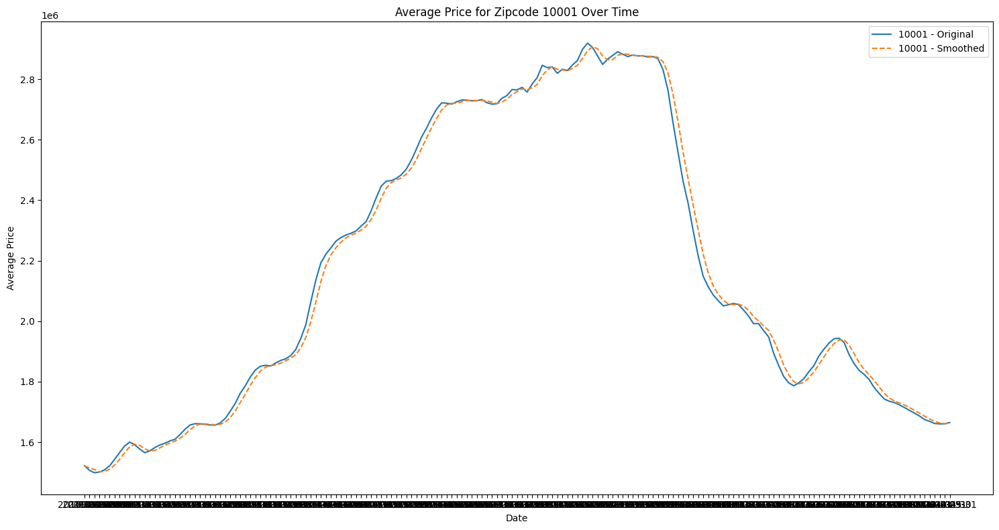

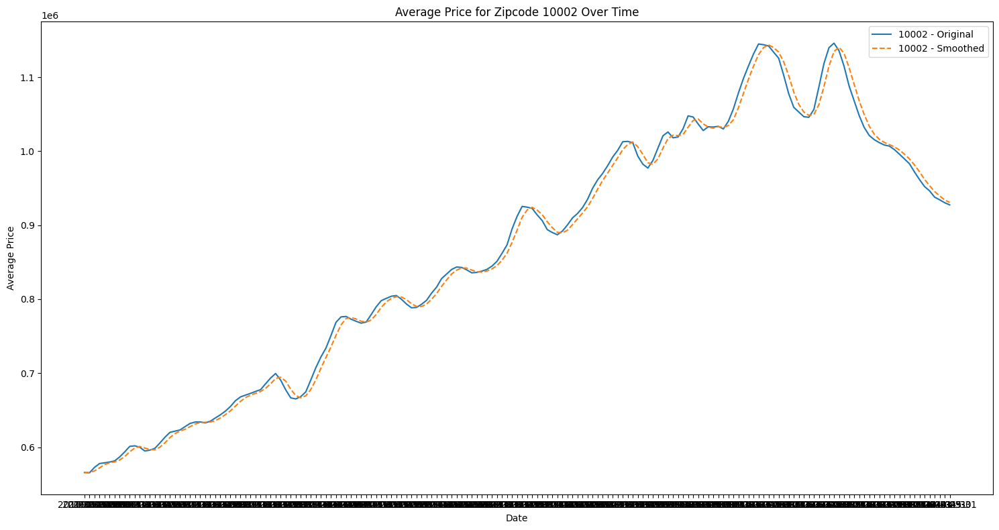

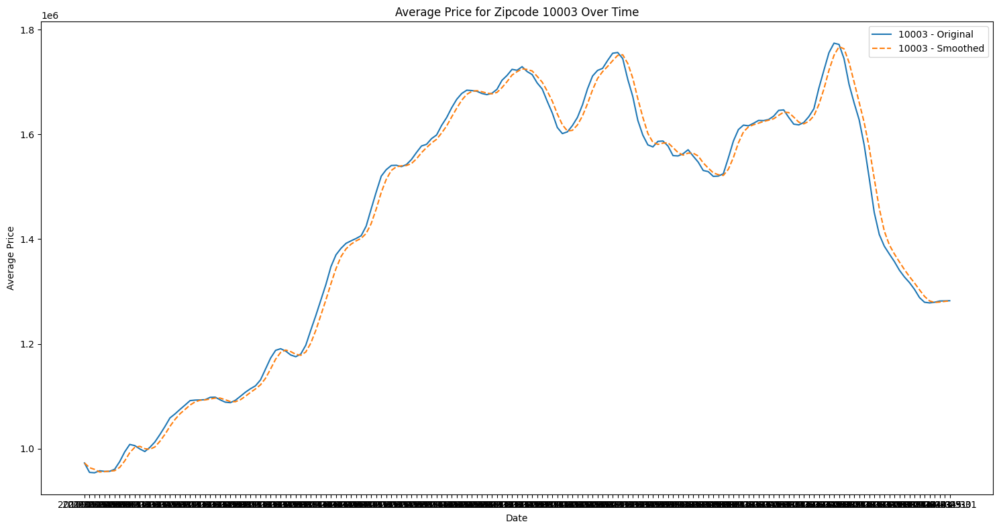

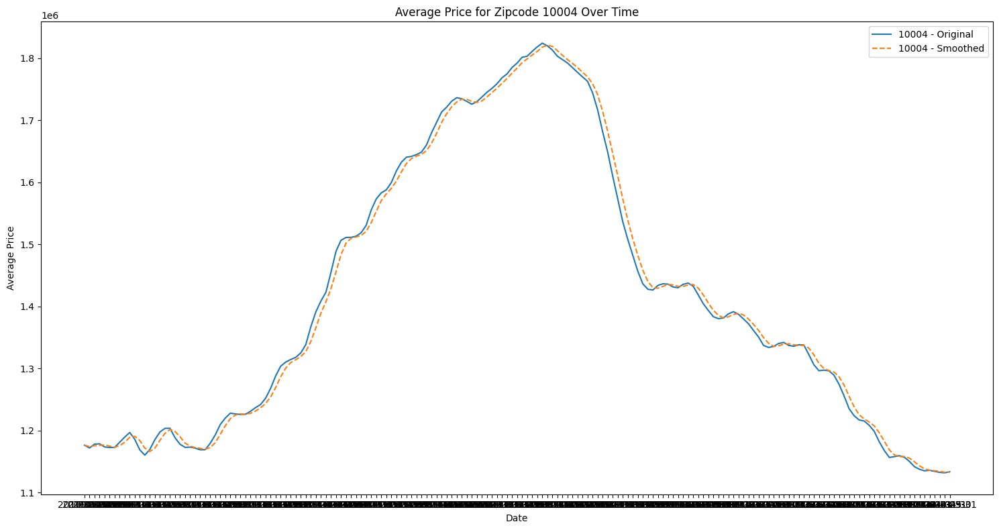

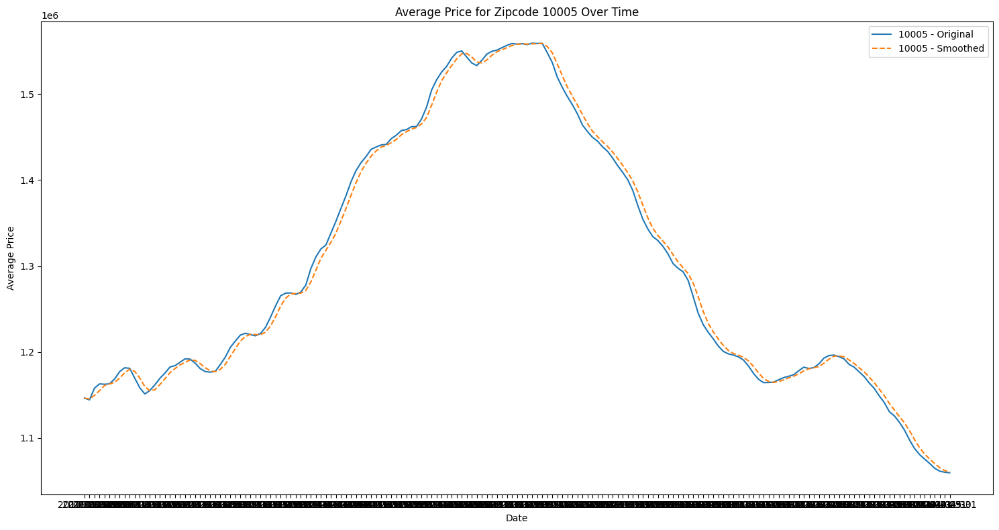

...

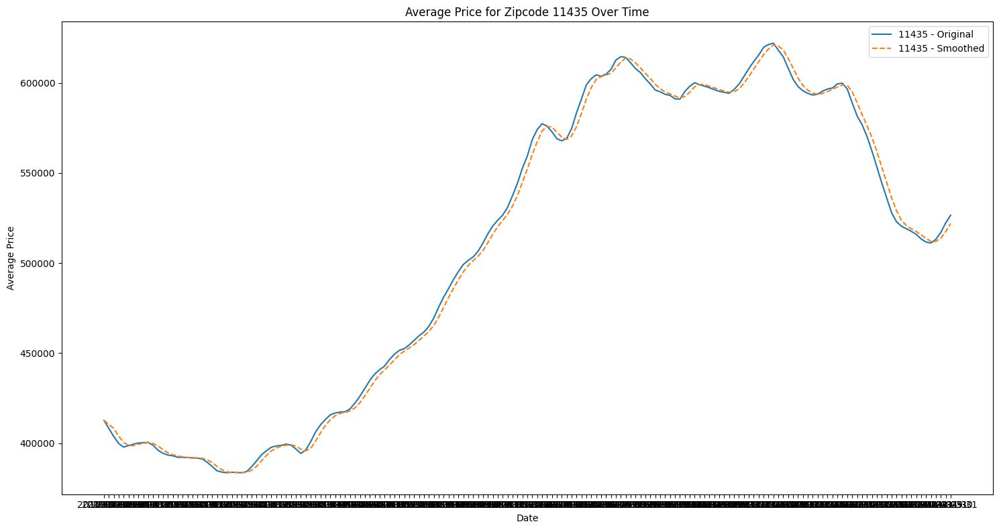

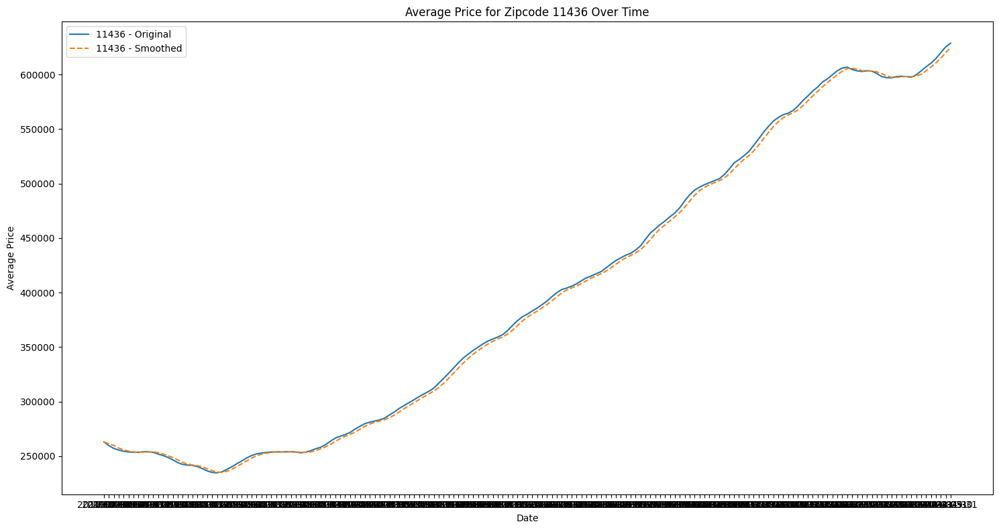

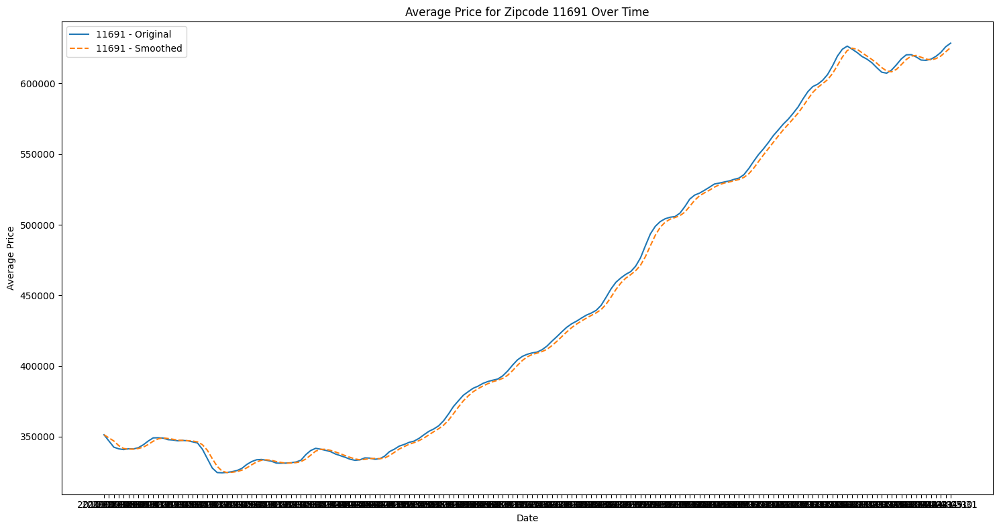

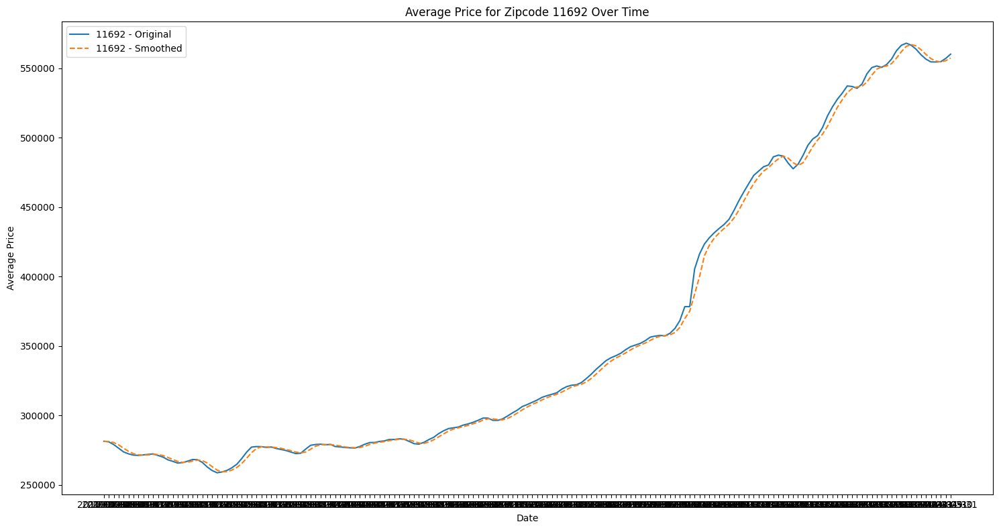

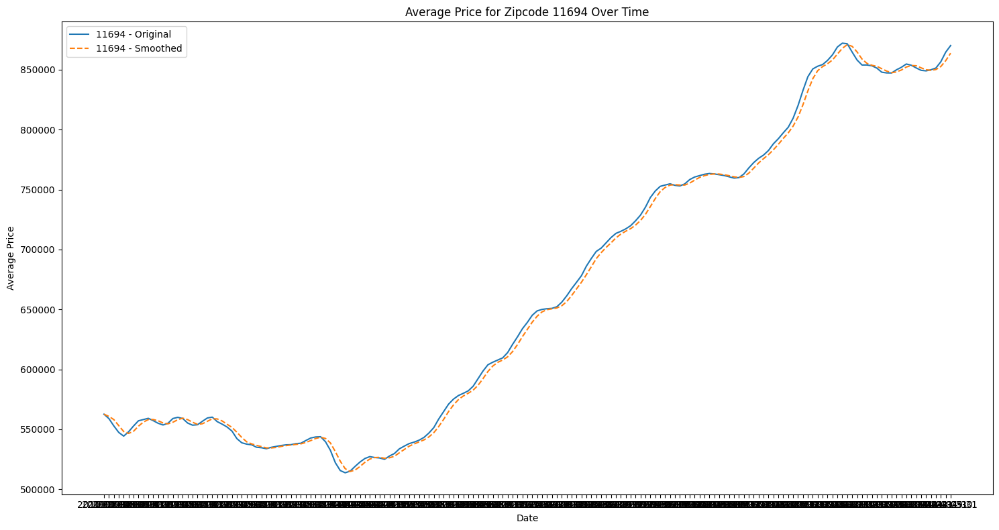

In [ ]:
import matplotlib.pyplot as plt

# Create individual plots for each zipcode
for zipcode in df_cleaned['ZipCode'].unique():
    zipcode_data = df_cleaned[df_cleaned['ZipCode'] == zipcode]
    
    plt.figure(figsize=(15, 8))
    plt.plot(zipcode_data['YearMonth'], zipcode_data['AveragePrice'], label=f'{zipcode} - Original')
    plt.plot(zipcode_data['YearMonth'], zipcode_data['SmoothedAveragePrice'], label=f'{zipcode} - Smoothed', linestyle='--')
    plt.title(f'Average Price for Zipcode {zipcode} Over Time')
    plt.xlabel('Date')
    plt.ylabel('Average Price')
    plt.legend()
    plt.tight_layout()